## San Francisco

In [1]:
import pandas as pd  
import numpy as np 
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import show
mpl.style.use('ggplot')
import json
import seaborn as sns
%matplotlib inline
import matplotlib.image as mpimg

import seaborn

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
#

In [2]:
df_sf = pd.read_csv('/dsa/groups/casestudy2022f/group_3/SFcleaning.csv')

In [3]:
df_sf.head(5)

,Unnamed: 0,id,listing_url,source,name,description,neighborhood_overview,host_id,host_name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,0,958,https://www.airbnb.com/rooms/958,city scrape,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,1169,Holly,2008-07-31,within an hour,90%,98%,t,1.0,"['email', 'phone']",t,t,"San Francisco, California, United States",Western Addition,37.77028,-122.43317,Entire serviced apartment,Entire home/apt,3,1 bath,1.0,2.0,"[""Shared patio or balcony"", ""Long term stays a...",$180.00,2,30,2.0,2.0,1125.0,1125.0,2.0,1125.0,t,2,5,17,140,2022-09-07,358,60,4,2009-07-23,2022-08-21,4.86,4.93,4.92,4.95,4.88,4.98,4.77,City Registration Pending,f,1,1,0,0,2.24
1,1,5858,https://www.airbnb.com/rooms/5858,city scrape,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,8904,Philip And Tania,2009-03-02,within a day,60%,70%,f,2.0,"['email', 'phone', 'work_email']",t,t,"San Francisco, California, United States",Bernal Heights,37.74474,-122.42089,Entire rental unit,Entire home/apt,4,1 bath,2.0,2.0,"[""Wifi"", ""Private entrance"", ""Long term stays ...",$235.00,30,60,30.0,30.0,60.0,60.0,30.0,60.0,t,30,60,90,365,2022-09-07,111,0,0,2009-05-03,2017-08-06,4.88,4.85,4.87,4.89,4.85,4.77,4.68,NaN,f,1,1,0,0,0.68
2,2,8014,https://www.airbnb.com/rooms/8014,previous scrape,room in FEMALE house WIFI market nearby,Room is on the second floor so it gets a good ...,"The neighborhood is very residential, close to...",22402,Jia,2009-06-20,within an hour,100%,90%,f,7.0,"['email', 'phone']",t,t,"San Francisco, California, United States",Outer Mission,37.73077,-122.44827,Private room in home,Private room,1,2 shared baths,1.0,1.0,"[""Long term stays allowed"", ""Oven"", ""Microwave...",$61.00,2,50,2.0,30.0,50.0,50.0,10.7,50.0,t,0,0,5,5,2022-09-07,86,1,1,2012-08-03,2022-09-04,4.75,4.73,4.29,4.91,4.94,4.59,4.67,STR-0000974,f,3,0,3,0,0.70
3,3,148627,https://www.airbnb.com/rooms/148627,city scrape,Romantic Marina Garden Studio,"Street parking only, please follow all signs.<...",Super convenient walking access to all the bes...,709325,Mark,2011-06-16,within an hour,100%,100%,f,12.0,"['email', 'phone']",t,t,"San Francisco, California, United States",Marina,37.79961,-122.42771,Entire rental unit,Entire home/apt,1,1 bath,1.0,1.0,"[""Long term stays allowed"", ""Oven"", ""Microwave...",$85.00,30,120,30.0,30.0,120.0,120.0,30.0,120.0,t,4,15,15,272,2022-09-07,116,4,0,2011-11-20,2022-08-06,4.29,4.55,4.64,4.73,4.46,4.63,4.32,NaN,f,5,5,0,0,0.88
4,4,494111,https://www.airbnb.com/rooms/494111,city scrape,Comfortable space of your own in SF,"<b>The space</b><br />A beautiful, bright, and...",The location is not considered a traditionally...,252927,Vivian,2010-10-04,within a day,100%,87%,t,2.0,"['email', 'phone']",t,t,"San Francisco, California, United States",Outer Richmond,37.77988,-122.48488,Entire rental unit,Entire ho

## Some Univariate Analysis:

### Number of Listings according to Host Response Time

In [4]:
# value_counts for host_response_time
df_sf['host_response_time'].value_counts()

within an hour        3687
within a few hours    1347
within a day           463
a few days or more      73
Name: host_response_time, dtype: int64

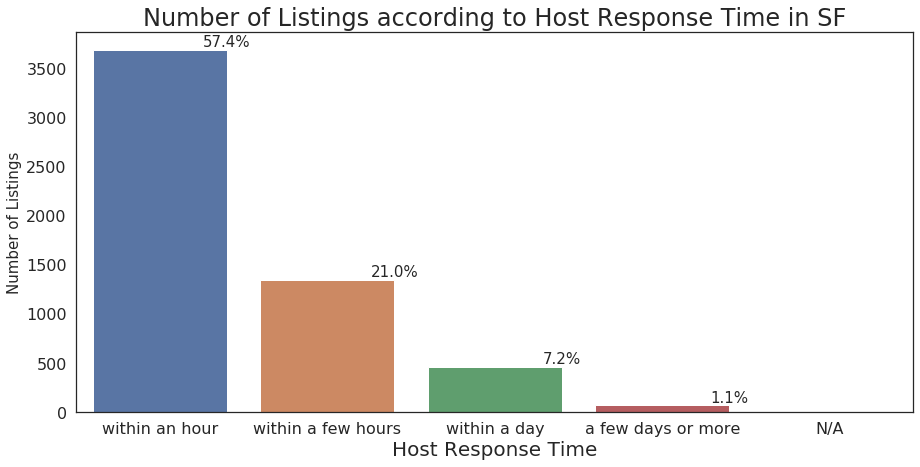

In [5]:
# Number of Listings according to Host Response Time in SF
sns.set(style="white")
plt.figure(figsize=(15,7))

order = ["within an hour", "within a few hours", "within a day", "a few days or more", "N/A"]
ax = sns.countplot(x="host_response_time", data=df_sf, order = order)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.title("Number of Listings according to Host Response Time in SF", fontsize=24)
plt.xlabel('Host Response Time', fontsize=20)
plt.ylabel('Number of Listings', fontsize=15)
# plt.xticks(rotation=90)

total = float(len(df_sf['host_response_time']))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center',va="bottom",fontsize=15)
    
plt.show()
show()

From the Analysis, we can see that 57.4% of the hosts can reply within an hour, 21% of the hosts reply within few hours, 7.2% hosts reply within a day, 1.1% hosts take time to reply within few days or more and 13.2% of the hosts do not reply at all.

### Number of Listings according to Host Response Rate

In [6]:
# doning a value count for each host_response_rate
df_sf['host_response_rate'].value_counts()

100%    4299
93%      173
90%      149
99%      145
80%      141
94%       83
98%       72
89%       60
91%       47
0%        47
50%       33
67%       28
96%       26
81%       26
70%       23
92%       21
95%       21
88%       20
86%       20
75%       16
87%       16
60%       16
83%       14
97%       12
85%       11
73%       10
40%        9
33%        7
82%        6
25%        4
78%        3
62%        3
72%        2
54%        1
63%        1
57%        1
42%        1
64%        1
38%        1
71%        1
Name: host_response_rate, dtype: int64

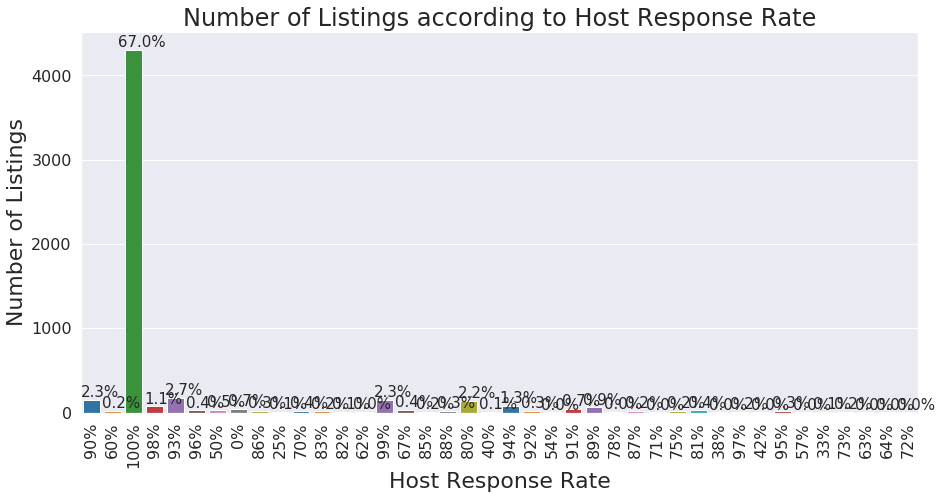

In [7]:
# Number of Listings according to Host Response Rate
sns.set(style="darkgrid")
plt.figure(figsize=(15,7))

ax = sns.countplot(x="host_response_rate", data=df_sf, palette='tab10')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.title("Number of Listings according to Host Response Rate", fontsize=24)
plt.xlabel('Host Response Rate', fontsize=22)
plt.ylabel('Number of Listings', fontsize=22)
plt.xticks(rotation=90)

total = float(len(df_sf['host_response_rate']))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center',va="bottom",fontsize=15)
    
plt.show()
show()

most of the response rate is 100%

#### Rooms types distribution:

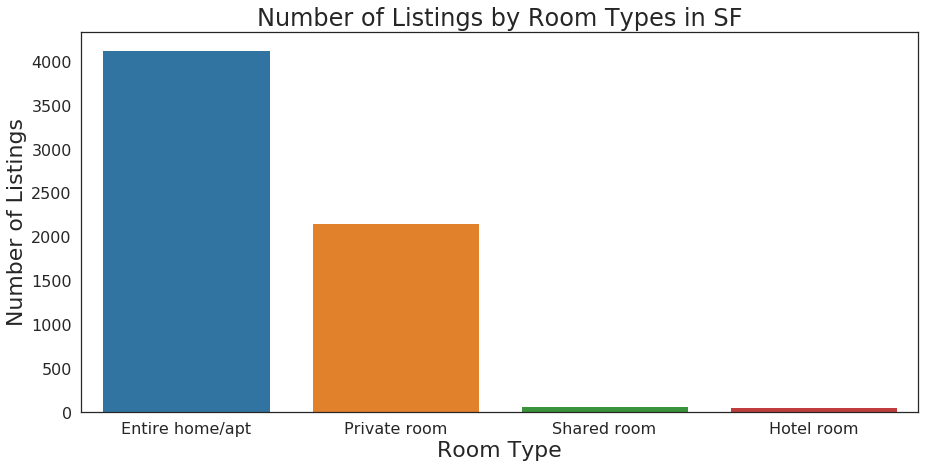

In [8]:
# find out what kind of room types and the number of each of them in SF
sns.set(style="white")
plt.figure(figsize=(15,7))

ax = sns.countplot(x="room_type", data=df_sf, palette='tab10')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.title("Number of Listings by Room Types in SF", fontsize=24)
plt.xlabel('Room Type', fontsize=22)
plt.ylabel('Number of Listings', fontsize=22)
# plt.xticks(rotation=90)
plt.show()
show()

As you can see from the above visualization, most of the Airbnb listings are either Entire home/Apartment followed by Private Room and then Shared Room and a very few Hotel rooms.

#### number of reviews distribution:

(array([5.337e+03, 5.800e+02, 2.480e+02, 1.370e+02, 6.800e+01, 2.700e+01,
        1.400e+01, 7.000e+00, 0.000e+00, 2.000e+00]),
 array([  0.,  96., 192., 288., 384., 480., 576., 672., 768., 864., 960.]),
 <a list of 10 Patch objects>)

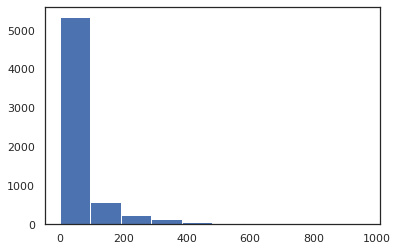

In [9]:
# number of listings for each number_of_reviews 
plt.hist(df_sf['number_of_reviews'])

(array([6.14e+03, 2.58e+02, 1.40e+01, 3.00e+00, 3.00e+00, 0.00e+00,
        0.00e+00, 0.00e+00, 1.00e+00, 1.00e+00]),
 array([ 0. ,  5.9, 11.8, 17.7, 23.6, 29.5, 35.4, 41.3, 47.2, 53.1, 59. ]),
 <a list of 10 Patch objects>)

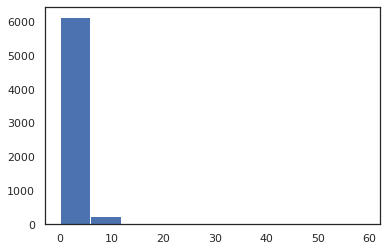

In [10]:
# number of listings for each number_of_reviews_l30d
plt.hist(df_sf['number_of_reviews_l30d']) 

(array([1347.,  326.,  415.,  107.,   56.,   73.,   14.,    9.,    4.,
           6.]),
 array([ 1. ,  2.4,  3.8,  5.2,  6.6,  8. ,  9.4, 10.8, 12.2, 13.6, 15. ]),
 <a list of 10 Patch objects>)

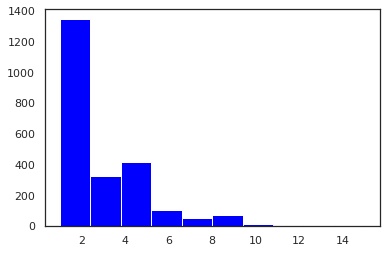

In [11]:
# narrow down the range
plt.hist(df_sf['number_of_reviews_l30d'], range=[1, 15], facecolor='blue')

#### Number of listings hosted by hosts: 

(array([6.212e+03, 1.500e+01, 1.800e+01, 0.000e+00, 3.200e+01, 0.000e+00,
        0.000e+00, 0.000e+00, 2.000e+00, 1.410e+02]),
 array([1.0000e+00, 4.3430e+02, 8.6760e+02, 1.3009e+03, 1.7342e+03,
        2.1675e+03, 2.6008e+03, 3.0341e+03, 3.4674e+03, 3.9007e+03,
        4.3340e+03]),
 <a list of 10 Patch objects>)

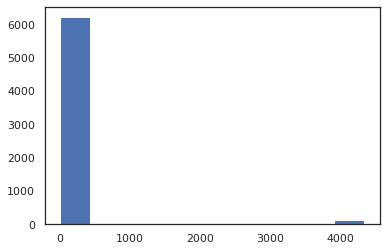

In [12]:
 plt.hist(df_sf['host_total_listings_count']) 

(array([2186.,  639.,  788.,  235.,  173.,  300.,   96.,  156.,   70.,
          58.]),
 array([ 1. ,  2.4,  3.8,  5.2,  6.6,  8. ,  9.4, 10.8, 12.2, 13.6, 15. ]),
 <a list of 10 Patch objects>)

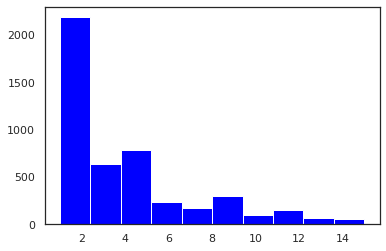

In [13]:
# narrow down the range
plt.hist(df_sf['host_total_listings_count'], range=[1, 15], facecolor='blue')

## Bivariate Analysis

#### room_type vs availability_365

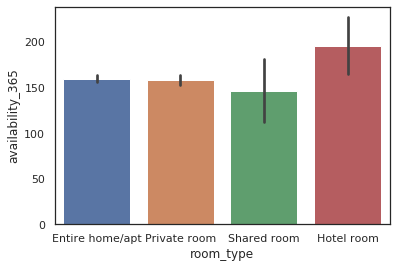

In [14]:
sns.barplot(x='room_type',y='availability_365',data=df_sf) 

#### room_type vs review_scores_rating

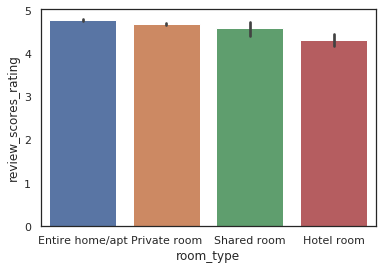

In [15]:
sns.barplot(x='room_type',y='review_scores_rating',data=df_sf) 

#### neighbourhood vs price

In [16]:
# carpentry for price column
df_sf["price"] = df_sf["price"].str.replace("[$,]","").astype(np.float64)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35]), <a list of 36 Text xticklabel objects>)

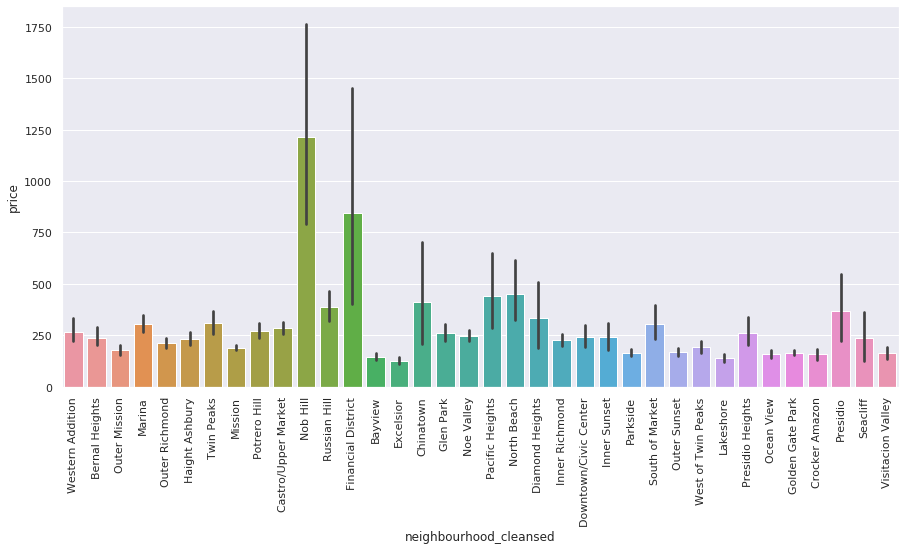

In [17]:
# quick look the price for each neighbourhood
sns.set(style="darkgrid")
plt.figure(figsize=(15,7))

sns.barplot(x='neighbourhood_cleansed',y='price',data=df_sf) 
plt.xticks(rotation=90)

In [18]:
# df_sf[df_sf['neighbourhood_cleansed']=='Nob Hill'].sort_values(by='price', ascending=False)

In [19]:
# df_sf.sort_values(by='price', ascending=False).head(30)

#### room type vs price

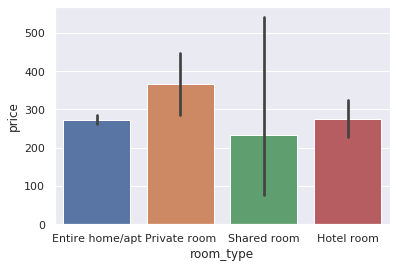

In [20]:
# price for each room type
sns.barplot(x='room_type',y='price',data=df_sf) 

## describe on price 
#### to see price distribution

In [21]:
df_sf['price'].describe()

count     6420.000000
mean       303.462238
std       1211.143457
min          0.000000
25%        105.000000
50%        160.000000
75%        255.000000
max      25000.000000
Name: price, dtype: float64

#### Price distribution in each neighbourhood

In [22]:
p_n = df_sf[["price",'neighbourhood_cleansed']]
p_n

,price,neighbourhood_cleansed
0,180.0,Western Addition
1,235.0,Bernal Heights
2,61.0,Outer Mission
3,85.0,Marina
4,146.0,Outer Richmond
...,...,...
6415,108.0,Ocean View
6416,47.0,Crocker Amazon
6417,191.0,Ocean View
6418,65.0,Crocker Amazon


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35]), <a list of 36 Text xticklabel objects>)

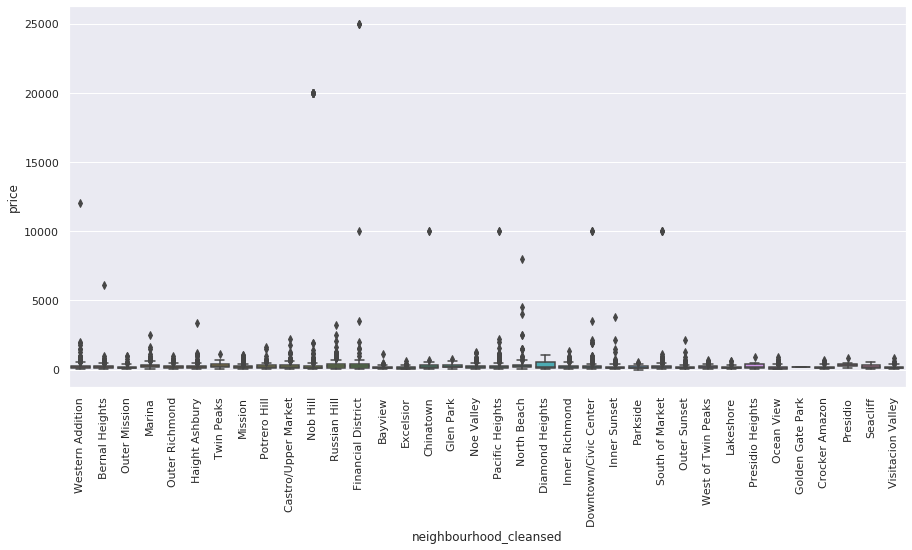

In [23]:
# do the plot
sns.set(style="darkgrid")
plt.figure(figsize=(15,7))

seaborn.boxplot(x='neighbourhood_cleansed', y='price', data=p_n)
plt.xticks(rotation=90)


In [24]:
# do the describe
p_n.groupby('neighbourhood_cleansed').describe() 

price                                                  \
                        count         mean          std    min     25%    50%   
neighbourhood_cleansed                                                          
Bayview                 148.0   145.841689   115.107539   40.0   75.00  110.0   
Bernal Heights          276.0   236.460145   381.969749   36.0  120.00  175.5   
Castro/Upper Market     256.0   284.566406   245.264970   65.0  144.75  200.0   
Chinatown               103.0   409.747573  1362.392624   59.0   97.00  210.0   
Crocker Amazon           88.0   157.147727   130.393969   45.0   74.25  108.5   
Diamond Heights          12.0   334.083333   298.703702   70.0  138.75  185.5   
Downtown/Civic Center   733.0   240.357435   665.392692   28.0  103.00  149.0   
Excelsior               146.0   127.363014    92.820173   36.0   62.25  100.0   
Financial District      155.0   844.980645  3511.709695   35.0  129.00  220.0   
Glen Park                53.0   262.528302   159.628246   60.0  148.00  211.0   
Golden Gate Park          3.0   162.333333    12.701706  155.0  155.00  155.0   
Haight Ashbury          272.0   231.661765   266.541405   50.0  110.00  160.0   
Inner Richmond          167.0   229.227545   187.123395   45.0  112.50  161.0   
Inner Sunset            135.0   240.377778   403.189446   31.0   90.00  140.0   
Lakeshore               106.0   139.415094   103.599491   29.0   78.25  106.5   
Marina                  188.0   306.079787   293.507553   38.0  152.00  225.0   
Mission                 542.0   189.337638   145.726006   33.0   97.00  145.0   
Nob Hill                296.0  1212.739865  4353.850583   27.0  100.00  144.0   
Noe Valley              216.0   247.319444   201.044609   38.0  130.00  180.5   
North Beach             137.0   453.109489   886.661042   38.0  150.00  242.0   
Ocean View              183.0   158.284153   138.060530   24.0   71.50  118.0   
Outer Mission           144.0   179.416667   158.626733   25.0   78.00  138.5   
Outer Richmond          160.0   212.268750   152.787258   31.0  110.00  178.0   
Outer Sunset            277.0   167.292419   173.850858   30.0   85.00  130.0   
Pacific Heights         144.0   443.104167  1189.092165   39.0  134.75  179.5   
Parkside                121.0   166.264463    97.383757    0.0   91.00  139.0   
Potrero Hill            138.0   272.123188   226.165415   52.0  140.00  195.0   
Presidio                  7.0   369.142857   247.025254  122.0  221.50  319.0   
Presidio Heights         25.0   263.520000   183.910105   67.0  132.00  213.0   
Russian Hill            143.0   389.321678   457.359377   45.0  133.50  223.0   
Seacliff                  7.0   238.857143   186.666752   70.0  123.00  169.0   
South of Market         434.0   305.158986   945.436266   29.0  130.00  188.0   
Twin Peaks               45.0   309.311111   202.180817   62.0  159.00  250.0   
Visitacion Valley        70.0   162.585714   130.586358   50.0   79.25  127.5   
West of Twin Peaks       88.0   192.306818   137.133994   42.0   98.00  156.0   
Western Addition        402.0   267.221393   633.899756   30.0  106.00  161.0   

                                         
                           75%      max  
neighbourhood_cleansed                   
Bayview                 188.50   1100.0  
Bernal Heights          260.00   6120.0  
Castro/Upper Market     346.75   2195.0  
Chinatown               293.00   9999.0  
Crocker Amazon          198.25    662.0  
Diamond Heights         559.25   1045.0  
Downtown/Civic Center   231.00  10000.0  
Excelsior               159.25    600.0  
Financial District      385.00  25000.0  
Glen Park               350.00    764.0  
Golden Gate Park        166.00    177.0  
Haight Ashbury          260.00   3392.0  
Inner Richmond          279.00   1371.0  
Inner Sunset            212.50   3800.0  
Lakeshore               178.75    650.0  
Marina                  339.75   2500.0  
Mission                 222.25   1060.0  
Nob Hill                

### Median Price & Number of Listings in Each Neighbourhood

In [25]:
# select column neighbourhood_cleansed and price
df_p = df_sf[['neighbourhood_cleansed', 'price']]
df_p.head(5)

,neighbourhood_cleansed,price
0,Western Addition,180.0
1,Bernal Heights,235.0
2,Outer Mission,61.0
3,Marina,85.0
4,Outer Richmond,146.0


In [26]:
# numbet of listings in each neighbourhood
c = pd.DataFrame(df_p['neighbourhood_cleansed'].value_counts())
c.reset_index(inplace=True)
c = c.rename(columns = {'index':'neighbourhood_cleansed',"neighbourhood_cleansed":"count"})
c.head()

,neighbourhood_cleansed,count
0,Downtown/Civic Center,733
1,Mission,542
2,South of Market,434
3,Western Addition,402
4,Nob Hill,296


In [27]:
# median price in each neighbourhood
df_p = df_p.groupby('neighbourhood_cleansed').median()
# .sort_values(by='price', ascending=False)
df_p.head()

,price
neighbourhood_cleansed,
Bayview,110.0
Bernal Heights,175.5
Castro/Upper Market,200.0
Chinatown,210.0
Crocker Amazon,108.5


In [28]:
# reset index
df_p.reset_index(inplace=True)
# df_p = df_p.rename(columns = {'index':'neighbourhood_cleansed'})
df_p.head()

,neighbourhood_cleansed,price
0,Bayview,110.0
1,Bernal Heights,175.5
2,Castro/Upper Market,200.0
3,Chinatown,210.0
4,Crocker Amazon,108.5


In [29]:
# merge the two dataframes above
df_merge = pd.merge(df_p,c, on='neighbourhood_cleansed', how='outer')
df_merge.head()

,neighbourhood_cleansed,price,count
0,Bayview,110.0,148
1,Bernal Heights,175.5,276
2,Castro/Upper Market,200.0,256
3,Chinatown,210.0,103
4,Crocker Amazon,108.5,88


In [30]:
# price > 300
df_high = df_merge[df_merge['price'] > 300]
df_high.loc[:,'MedianPriceRange'] = 'high(> $300)'
df_high

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:376: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,neighbourhood_cleansed,price,count,MedianPriceRange
27,Presidio,319.0,7,high(> $300)


In [31]:
# price <110
df_low=df_merge[df_merge['price']< 110]
df_low.loc[:,'MedianPriceRange'] = 'low(< $110)'

df_low

,neighbourhood_cleansed,price,count,MedianPriceRange
4,Crocker Amazon,108.5,88,low(< $110)
7,Excelsior,100.0,146,low(< $110)
14,Lakeshore,106.5,106,low(< $110)


In [32]:
# price >=110 and <=300
df_medium=df_merge.loc[(df_merge['price'] >= 110) & (df_merge['price'] <= 300)]
df_medium.loc[:,'MedianPriceRange'] = 'medium(>= $110 &<= $300)'
df_medium

,neighbourhood_cleansed,price,count,MedianPriceRange
0,Bayview,110.0,148,medium(>= $110 &<= $300)
1,Bernal Heights,175.5,276,medium(>= $110 &<= $300)
2,Castro/Upper Market,200.0,256,medium(>= $110 &<= $300)
3,Chinatown,210.0,103,medium(>= $110 &<= $300)
5,Diamond Heights,185.5,12,medium(>= $110 &<= $300)
6,Downtown/Civic Center,149.0,733,medium(>= $110 &<= $300)
8,Financial District,220.0,155,medium(>= $110 &<= $300)
9,Glen Park,211.0,53,medium(>= $110 &<= $300)
10,Golden Gate Park,155.0,3,medium(>= $110 &<= $300)
11,Haight Ashbury,160.0,272,medium(>= $110 &<= $300)


In [33]:
# merge df_high, df_medium,df_low
frames = [df_high, df_medium,df_low]
result = pd.concat(frames)
# result.reset_index(inplace=True)
# result = result.rename(columns = {'index':'neighbourhood_cleansed'})
result

,neighbourhood_cleansed,price,count,MedianPriceRange
27,Presidio,319.0,7,high(> $300)
0,Bayview,110.0,148,medium(>= $110 &<= $300)
1,Bernal Heights,175.5,276,medium(>= $110 &<= $300)
2,Castro/Upper Market,200.0,256,medium(>= $110 &<= $300)
3,Chinatown,210.0,103,medium(>= $110 &<= $300)
5,Diamond Heights,185.5,12,medium(>= $110 &<= $300)
6,Downtown/Civic Center,149.0,733,medium(>= $110 &<= $300)
8,Financial District,220.0,155,medium(>= $110 &<= $300)
9,Glen Park,211.0,53,medium(>= $110 &<= $300)
10,Golden Gate Park,155.0,3,medium(>= $110 &<= $300)


###  Plot for Median Price & Number of Listings in Each Neighbourhood

Text(0, 0.5, 'Median Price')

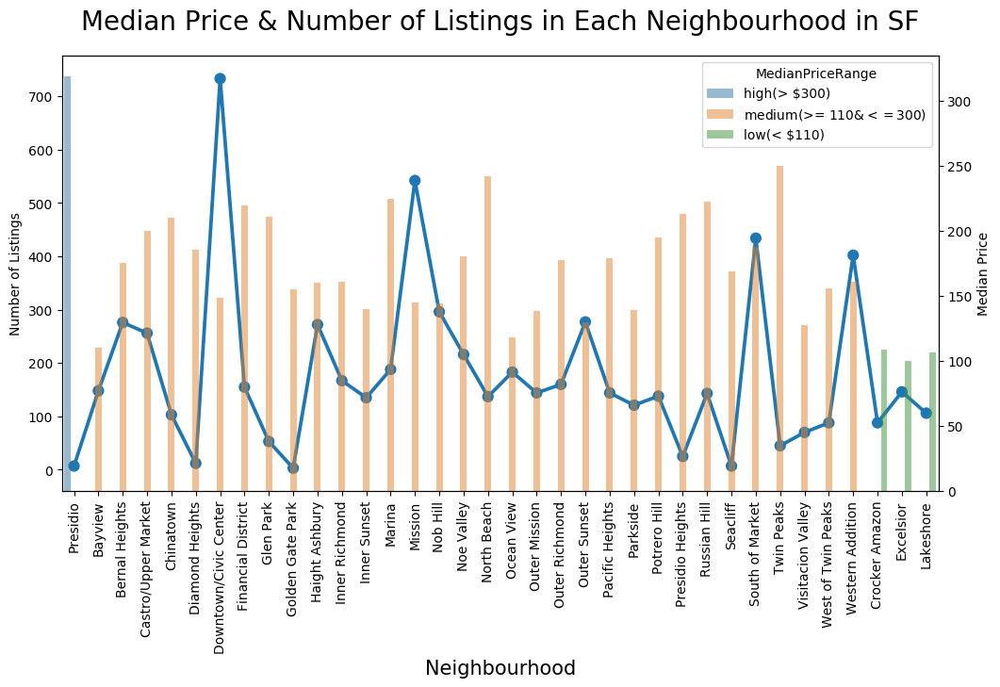

In [34]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

matplotlib.rc_file_defaults()
ax1 = sns.set_style(style=None, rc=None )

fig, ax1 = plt.subplots(figsize=(12,6))

sns.pointplot(data = result,x='neighbourhood_cleansed',y='count', ax=ax1)
# plt.text()
plt.xticks(rotation=90)
plt.ylabel('Number of Listings',fontsize=10)
plt.xlabel("Neighbourhood",fontsize=15)
ax2 = ax1.twinx()

sns.barplot(data=result,x='neighbourhood_cleansed',y='price',hue='MedianPriceRange',alpha=0.5,ax=ax2)
plt.title("Median Price & Number of Listings in Each Neighbourhood in SF", size=20,pad=20)
plt.ylabel('Number of Listings',fontsize=10)
plt.ylabel('Median Price',fontsize=10)


Prices offered above $300 on the median are a High Price, between $110 to $300, the Medium Price range, and less than $110 is considered a Low-Price range. The line in the graph shows the variation in the number of listings in different neighborhoods.
Presidio is the only Neighborhood in San Francisco that lies in offering the Highest Price range of listings on Airbnb. But obviously, it has a relatively small number of listings. Crocker Amazon, Excelsior, and Lakeshore are the three Neighborhoods that lie in offering the low Price range of listings on Airbnb. 
Most popular Neighborhood in the Airbnb listings is Downtown/Civic Center. The second most preferred is Mission. Most neighborhoods have between 100 and 200 Airbnb listings. 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35]), <a list of 36 Text xticklabel objects>)

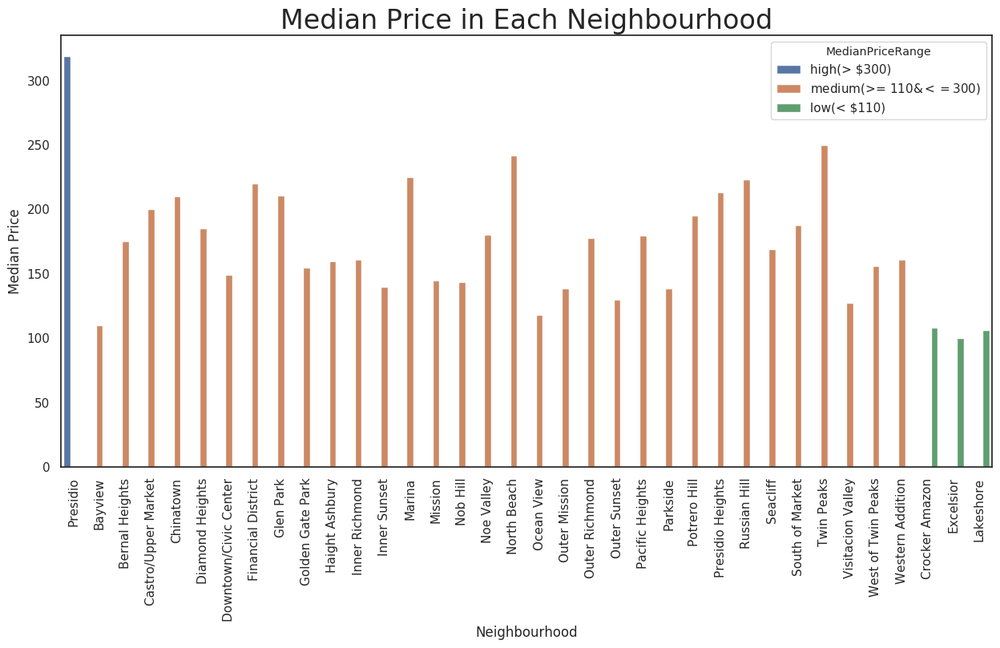

In [35]:
# Median Price in Each Neighbourhood
sns.set(style="white")
plt.figure(figsize=(15,7))

# sns.barplot

seaborn.barplot(data=result,x='neighbourhood_cleansed',y='price',hue='MedianPriceRange')
plt.title("Median Price in Each Neighbourhood", fontsize=24)
plt.xlabel("Neighbourhood")
plt.ylabel('Median Price')
plt.xticks(rotation=90)

### the locations distribution

In [36]:
# use neighbourhood_cleansed, latitude, longitude column
df_h = df_sf[['neighbourhood_cleansed', 'latitude', 'longitude']]
df_h

,neighbourhood_cleansed,latitude,longitude
0,Western Addition,37.77028,-122.43317
1,Bernal Heights,37.74474,-122.42089
2,Outer Mission,37.73077,-122.44827
3,Marina,37.79961,-122.42771
4,Outer Richmond,37.77988,-122.48488
...,...,...,...
6415,Ocean View,37.70141,-122.46265
6416,Crocker Amazon,37.70684,-122.45353
6417,Ocean View,37.70684,-122.46433
6418,Crocker Amazon,37.70549,-122.45417


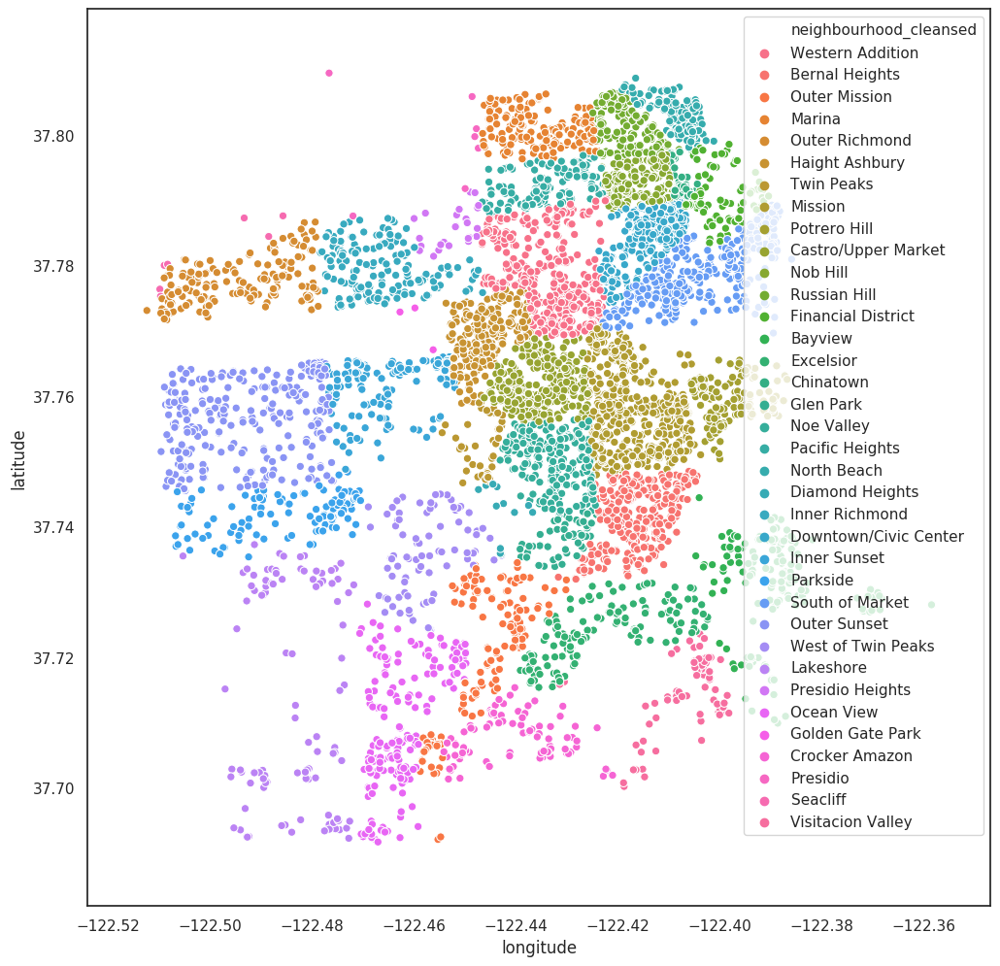

In [37]:
# plot for the locations distribution
plt.figure(figsize = (12,12))
sns.scatterplot(x =df_h['longitude'], y = df_h['latitude'], hue = df_h['neighbourhood_cleansed'])
plt.show()

In [38]:
# df_sf['neighbourhood_cleansed'].unique()

In [39]:
# plt.figure(figsize=(18,12))
# plt.style.use('fivethirtyeight')
# # BBox = (103.5935, 104.0625, 1.1775, 1.5050)
# # sg_map = plt.imread('map_bnw.png')
# # plt.imshow(sg_map,zorder=0,extent=BBox)
# ax = plt.gca()
# groups = df_sf.groupby('neighbourhood_cleansed')
# for name,group in groups :
#     plt.scatter(group['longitude'],group['latitude'],label=name,alpha=0.5, edgecolors='k')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.legend()

#### Which neighborhoods have many listings? Which neighborhoods have almost no listings?

In [40]:
# count listings in each neighbourhood
df_n=df_h['neighbourhood_cleansed'].value_counts()
df_n

Downtown/Civic Center    733
Mission                  542
South of Market          434
Western Addition         402
Nob Hill                 296
Outer Sunset             277
Bernal Heights           276
Haight Ashbury           272
Castro/Upper Market      256
Noe Valley               216
Marina                   188
Ocean View               183
Inner Richmond           167
Outer Richmond           160
Financial District       155
Bayview                  148
Excelsior                146
Outer Mission            144
Pacific Heights          144
Russian Hill             143
Potrero Hill             138
North Beach              137
Inner Sunset             135
Parkside                 121
Lakeshore                106
Chinatown                103
West of Twin Peaks        88
Crocker Amazon            88
Visitacion Valley         70
Glen Park                 53
Twin Peaks                45
Presidio Heights          25
Diamond Heights           12
Presidio                   7
Seacliff      

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35]), <a list of 36 Text xticklabel objects>)

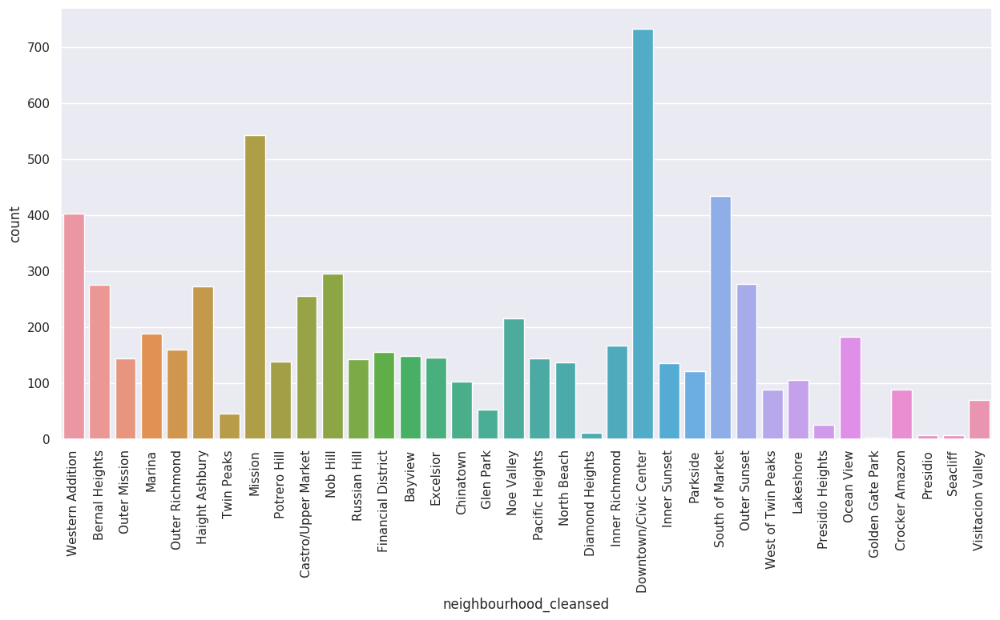

In [41]:
# the plot for number of listings in each neighbourhood
sns.set(style="darkgrid")
plt.figure(figsize=(15,7))

sns.countplot(df_sf['neighbourhood_cleansed'])
plt.xticks(rotation=90)

#### amenities

In [42]:
# explore the amenities column
dfs = df_sf.sample(frac = 0.05) # take a sample to save time
dfs['amenities'] = dfs['amenities'].astype(str)
dfs['amenities'] = dfs['amenities'].str.replace('[', '')
dfs['amenities'] = dfs['amenities'].str.replace(']', '')
dfs_amenities = dfs['amenities'].str.get_dummies(sep=',')
dfs_amenities

,"""15\"" TV with Amazon Prime Video","""2 Burner Cooktop electric stove""","""32\"" HDTV with Amazon Prime Video","""32\"" HDTV with Chromecast""","""32\"" HDTV with Netflix""","""32\"" HDTV with standard cable""","""32\"" HDTV""","""32\"" TV with standard cable""","""40\"" HDTV with Netflix","""42\"" HDTV with Amazon Prime Video","""42\"" HDTV with premium cable""","""43\"" HDTV with Amazon Prime Video","""43\"" HDTV""","""44\"" HDTV with Amazon Prime Video","""46\"" HDTV""","""49\"" HDTV with Netflix","""49\"" TV""","""50\"" HDTV with Apple TV","""50\"" HDTV with Netflix","""50\"" TV with Netflix","""52\"" HDTV""","""53\"" TV with Amazon Prime Video","""55\"" HDTV with Amazon Prime Video","""55\"" HDTV with Apple TV","""55\"" HDTV with Netflix","""55\"" TV with Amazon Prime Video","""60\"" HDTV with Amazon Prime Video","""62\"" HDTV with HBO Max","""65\"" HDTV with Amazon Prime Video","""65\"" HDTV with Netflix","""65\"" HDTV with Roku""","""65\"" HDTV""","""AC - split type ductless system""","""Aesop body soap""","""Air conditioning""","""All brand conditioner""","""Apple","""BBQ grill""","""Baby bath""","""Baby monitor""","""Baby safety gates""","""Babysitter recommendations""","""Backyard""","""Baking sheet""","""Barbecue utensils""","""Bath & Body Works conditioner""","""Bath & Body Works shampoo""","""Bathroom essentials""","""Bathtub""","""Beach essentials""","""Beachfront""","""Bed linens""","""Bedroom comforts""","""Bidet""","""Bikes""","""Bluetooth sound system""","""Board games""","""Body soap""","""Bose Bluetooth sound system""","""Bread maker""","""Breakfast""","""Building staff""","""Cable TV""","""Carbon monoxide alarm""","""Ceiling fan""","""Central air conditioning""","""Central heating""","""Changing table""","""Children\u2019s books and toys for ages 0-2 years old and 2-5 years old""","""Children\u2019s books and toys for ages 2-5 years old and 5-10 years old""","""Children\u2019s books and toys for ages 5-10 years old""","""Children\u2019s books and toys""","""Children\u2019s dinnerware""","""Cleaning before checkout""","""Cleaning products""","""Clothing storage""","""Clothing storage: closet","""Clothing storage: closet and dresser""","""Clothing storage: closet and wardrobe""","""Clothing storage: closet""","""Clothing storage: dresser","""Clothing storage: dresser and closet""","""Clothing storage: dresser and wardrobe""","""Clothing storage: dresser""","""Clothing storage: walk-in closet","""Clothing storage: walk-in closet""","""Clothing storage: wardrobe","""Clothing storage: wardrobe and closet""","""Clothing storage: wardrobe""","""Coffee maker""","""Conditioner""","""Cooking basics""","""Crib - always at the listing""","""Crib - available upon request""","""Crib""","""Dave body soap""","""Dedicated workspace""","""Denon","""Dining table""","""Dishes and silverware""","""Dishwasher""","""Dove Unscented Hypoallergenic body soap""","""Dove body soap""","""Dove conditioner""","""Dove neutral body soap""","""Dove shampoo""","""Dove unscented body soap""","""Dryer \u2013 In building""","""Dryer \u2013\u00a0In unit""","""Dryer""","""Drying rack for clothing""","""EO shampoo""","""EV charger - level 2""","""EV charger""","""Electric stove""","""Elevator""","""Essentials""","""Ethernet connection""","""Extra pillows and blankets""","""Fast wifi \u2013 105 Mbps""","""Fast wifi \u2013 159 Mbps""","""Fast wifi \u2013 313 Mbps""","""Fast wifi \u2013 317 Mbps""","""Fast wifi \u2013 320 Mbps""","""Fast wifi \u2013 345 Mbps""","""Fast wifi \u2013 347 Mbps""","""Fast wifi \u2013 350 Mbps""","""Fast wifi \u2013 353 Mbps""","""Fast wifi \u2013 427 Mbps""","""Fast wifi \u2013 431 Mbps""","""Fast wifi \u2013 491 Mbps""","""Fast wifi \u2013 502 Mbps""","""Fast wifi \u2013 531 Mbps""","""Fast wifi \u2013 558 Mbps""","""Fast wifi \u2013 57 Mbps""","""Fast wifi \u2013 59 Mbps""","""Fast wifi \u2013 60 Mbps""","""Fast wifi \u2013 657 Mbps""","""Fast wifi \u2013 712 Mbps""","""Fast wifi \u2013 74 Mbps""","""Fast wifi \u20

In [43]:
# count each of the amenities
dfs_amenities_nb = dfs_amenities.apply(pd.Series.value_counts)
dfs_amenities_nb

,"""15\"" TV with Amazon Prime Video","""2 Burner Cooktop electric stove""","""32\"" HDTV with Amazon Prime Video","""32\"" HDTV with Chromecast""","""32\"" HDTV with Netflix""","""32\"" HDTV with standard cable""","""32\"" HDTV""","""32\"" TV with standard cable""","""40\"" HDTV with Netflix","""42\"" HDTV with Amazon Prime Video","""42\"" HDTV with premium cable""","""43\"" HDTV with Amazon Prime Video","""43\"" HDTV""","""44\"" HDTV with Amazon Prime Video","""46\"" HDTV""","""49\"" HDTV with Netflix","""49\"" TV""","""50\"" HDTV with Apple TV","""50\"" HDTV with Netflix","""50\"" TV with Netflix","""52\"" HDTV""","""53\"" TV with Amazon Prime Video","""55\"" HDTV with Amazon Prime Video","""55\"" HDTV with Apple TV","""55\"" HDTV with Netflix","""55\"" TV with Amazon Prime Video","""60\"" HDTV with Amazon Prime Video","""62\"" HDTV with HBO Max","""65\"" HDTV with Amazon Prime Video","""65\"" HDTV with Netflix","""65\"" HDTV with Roku""","""65\"" HDTV""","""AC - split type ductless system""","""Aesop body soap""","""Air conditioning""","""All brand conditioner""","""Apple","""BBQ grill""","""Baby bath""","""Baby monitor""","""Baby safety gates""","""Babysitter recommendations""","""Backyard""","""Baking sheet""","""Barbecue utensils""","""Bath & Body Works conditioner""","""Bath & Body Works shampoo""","""Bathroom essentials""","""Bathtub""","""Beach essentials""","""Beachfront""","""Bed linens""","""Bedroom comforts""","""Bidet""","""Bikes""","""Bluetooth sound system""","""Board games""","""Body soap""","""Bose Bluetooth sound system""","""Bread maker""","""Breakfast""","""Building staff""","""Cable TV""","""Carbon monoxide alarm""","""Ceiling fan""","""Central air conditioning""","""Central heating""","""Changing table""","""Children\u2019s books and toys for ages 0-2 years old and 2-5 years old""","""Children\u2019s books and toys for ages 2-5 years old and 5-10 years old""","""Children\u2019s books and toys for ages 5-10 years old""","""Children\u2019s books and toys""","""Children\u2019s dinnerware""","""Cleaning before checkout""","""Cleaning products""","""Clothing storage""","""Clothing storage: closet","""Clothing storage: closet and dresser""","""Clothing storage: closet and wardrobe""","""Clothing storage: closet""","""Clothing storage: dresser","""Clothing storage: dresser and closet""","""Clothing storage: dresser and wardrobe""","""Clothing storage: dresser""","""Clothing storage: walk-in closet","""Clothing storage: walk-in closet""","""Clothing storage: wardrobe","""Clothing storage: wardrobe and closet""","""Clothing storage: wardrobe""","""Coffee maker""","""Conditioner""","""Cooking basics""","""Crib - always at the listing""","""Crib - available upon request""","""Crib""","""Dave body soap""","""Dedicated workspace""","""Denon","""Dining table""","""Dishes and silverware""","""Dishwasher""","""Dove Unscented Hypoallergenic body soap""","""Dove body soap""","""Dove conditioner""","""Dove neutral body soap""","""Dove shampoo""","""Dove unscented body soap""","""Dryer \u2013 In building""","""Dryer \u2013\u00a0In unit""","""Dryer""","""Drying rack for clothing""","""EO shampoo""","""EV charger - level 2""","""EV charger""","""Electric stove""","""Elevator""","""Essentials""","""Ethernet connection""","""Extra pillows and blankets""","""Fast wifi \u2013 105 Mbps""","""Fast wifi \u2013 159 Mbps""","""Fast wifi \u2013 313 Mbps""","""Fast wifi \u2013 317 Mbps""","""Fast wifi \u2013 320 Mbps""","""Fast wifi \u2013 345 Mbps""","""Fast wifi \u2013 347 Mbps""","""Fast wifi \u2013 350 Mbps""","""Fast wifi \u2013 353 Mbps""","""Fast wifi \u2013 427 Mbps""","""Fast wifi \u2013 431 Mbps""","""Fast wifi \u2013 491 Mbps""","""Fast wifi \u2013 502 Mbps""","""Fast wifi \u2013 531 Mbps""","""Fast wifi \u2013 558 Mbps""","""Fast wifi \u2013 57 Mbps""","""Fast wifi \u2013 59 Mbps""","""Fast wifi \u2013 60 Mbps""","""Fast wifi \u2013 657 Mbps""","""Fast wifi \u2013 712 Mbps""","""Fast wifi \u2013 74 Mbps""","""Fast wifi \u20

In [44]:
# count each of the amenities
dfs_amenities_nb = dfs_amenities_nb.T

dfs_amenities_nb.columns = ['False', 'True']
dfs_amenities_nb

# dfs_amenities_nb.rename({'0': 'False', '1': 'True'}, axis=1, inplace=True)
# dfs_amenities_nb

,False,True
"""15\"" TV with Amazon Prime Video",320,1
"""2 Burner Cooktop electric stove""",320,1
"""32\"" HDTV with Amazon Prime Video",319,2
"""32\"" HDTV with Chromecast""",320,1
"""32\"" HDTV with Netflix""",320,1
"""32\"" HDTV with standard cable""",320,1
"""32\"" HDTV""",320,1
"""32\"" TV with standard cable""",320,1
"""40\"" HDTV with Netflix",320,1
"""42\"" HDTV with Amazon Prime Video",318,3


In [45]:
# sort the number of the amenities
dfs_amenities_sort = dfs_amenities_nb.sort_values(by='True', ascending = False)
dfs_amenities_sort1 = dfs_amenities_sort.head(30)
dfs_amenities_sort1

,False,True
"""Smoke alarm""",13,308
"""Essentials""",23,298
"""Carbon monoxide alarm""",42,279
"""Hangers""",42,279
"""Hair dryer""",45,276
"""Iron""",52,269
"""Hot water""",74,247
"""Kitchen""",77,244
"""Heating""",78,243
"""Shampoo""",84,237


In [46]:
dfs_amenities_sort2 = dfs_amenities_sort.tail(20)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 <a list of 30 Text xticklabel objects>)

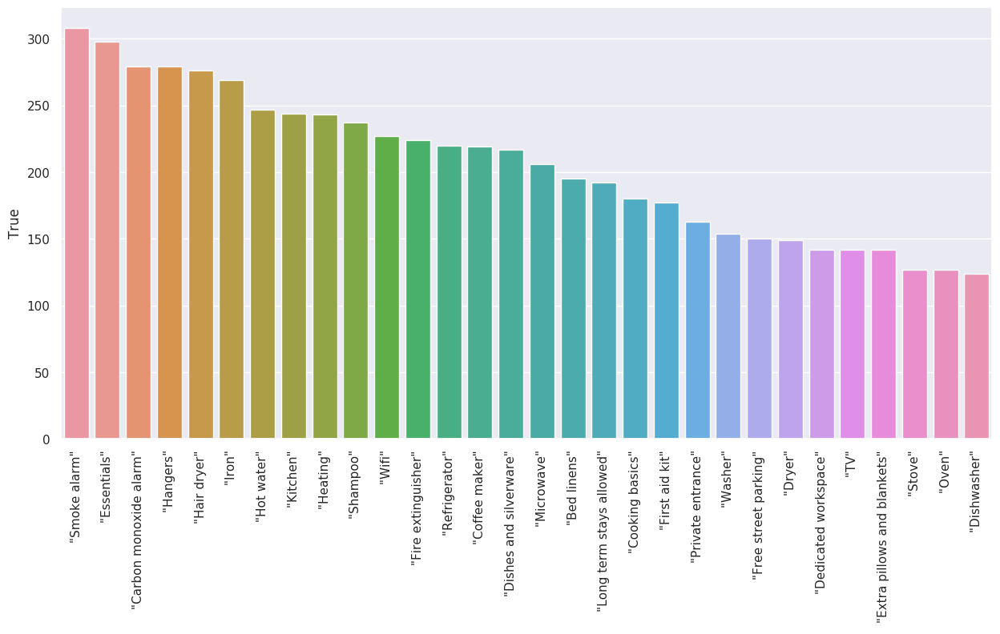

In [47]:
# first 20 amenities
sns.set(style="darkgrid")
plt.figure(figsize=(15,7))

sns.barplot(dfs_amenities_sort1.index.values,dfs_amenities_sort1['True']) 
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text xticklabel objects>)

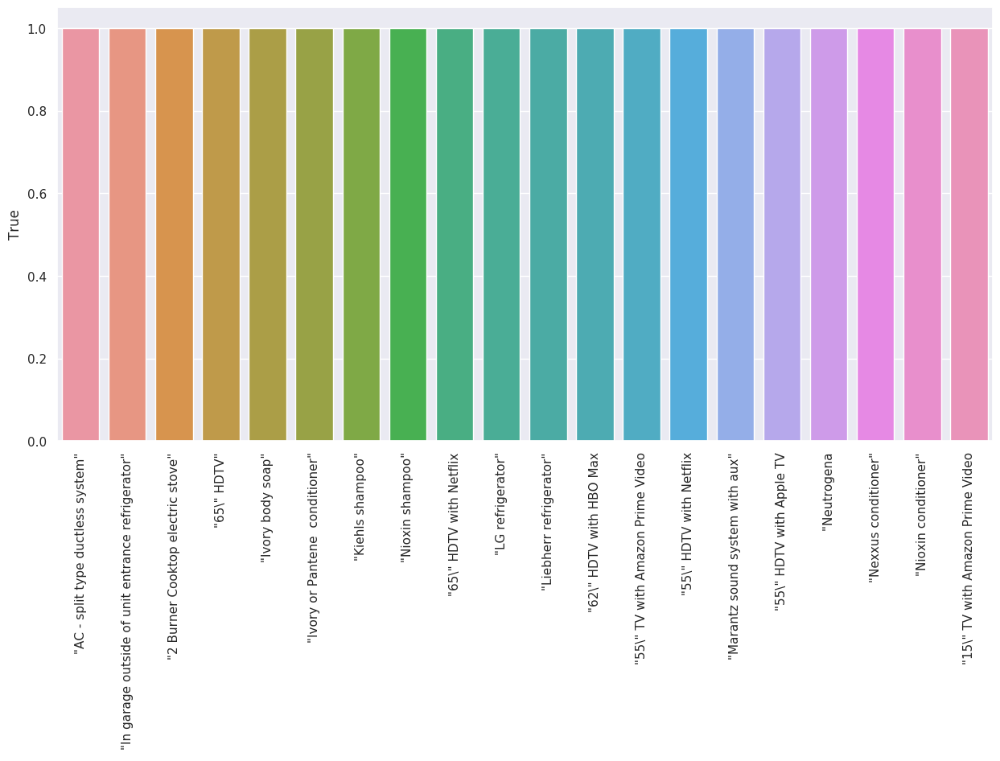

In [48]:
# last 20 amenities
sns.set(style="darkgrid")
plt.figure(figsize=(15,7))

sns.barplot(dfs_amenities_sort2.index.values,dfs_amenities_sort2['True']) 
plt.xticks(rotation=90)

### Neighborhood Vs Number of Reviews

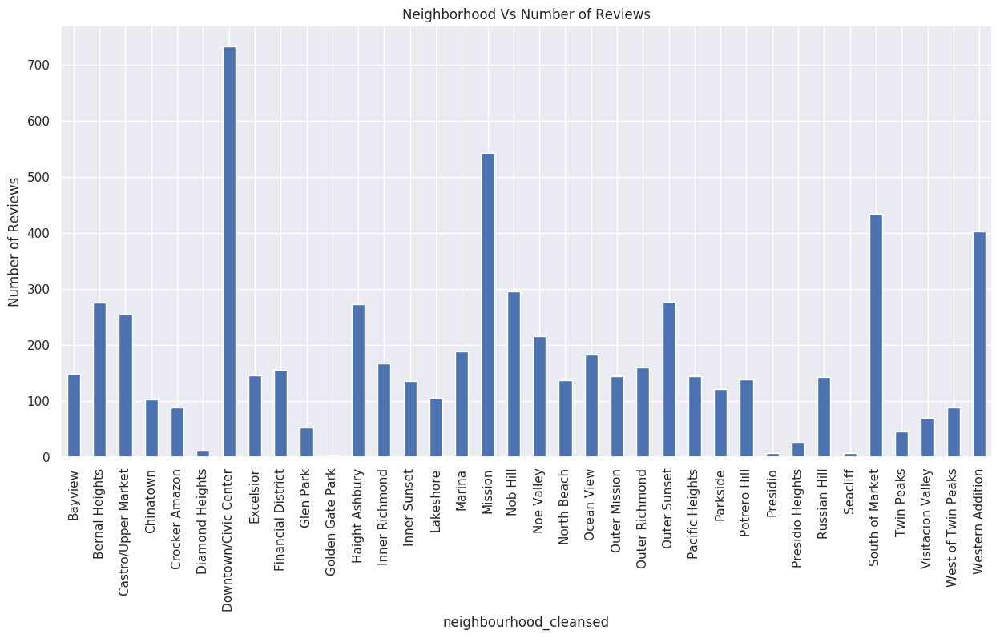

In [49]:
# Number of Reviews in each neighbourhood
sns.set(style="darkgrid")
plt.figure(figsize=(15,7))
df_sf.groupby(['neighbourhood_cleansed']).count()['number_of_reviews'].plot(kind = 'bar')
plt.title('Neighborhood Vs Number of Reviews')
plt.xlabel("neighbourhood_cleansed")
plt.ylabel('Number of Reviews')
plt.xticks(rotation=90)
plt.show();

### Room Type Vs Number of Reviews

In [50]:
df_review=pd.DataFrame(df_sf.groupby(['room_type']).count()['number_of_reviews'])
df_review

,number_of_reviews
room_type,
Entire home/apt,4131
Hotel room,63
Private room,2153
Shared room,73


In [51]:
df_review.reset_index(inplace=True)
# df_p = df_p.rename(columns = {'index':'neighbourhood_cleansed'})
df_review

,room_type,number_of_reviews
0,Entire home/apt,4131
1,Hotel room,63
2,Private room,2153
3,Shared room,73


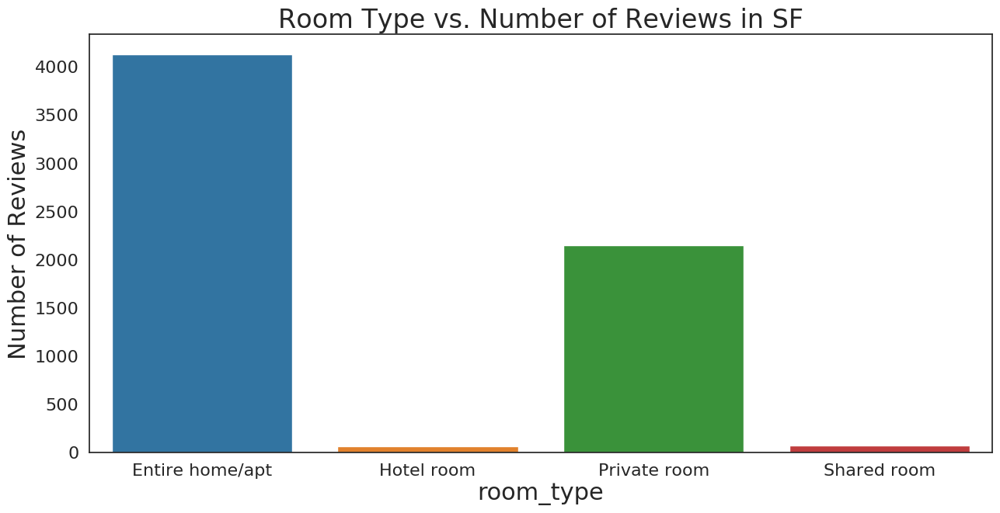

In [52]:
# plot for Room Type vs. Number of Reviews in SF
sns.set(style="white")
plt.figure(figsize=(15,7))
# df_sf.groupby(['room_type']).count()['number_of_reviews'].plot(kind = 'bar')
ax = sns.barplot(x="room_type", y='number_of_reviews',data=df_review, palette='tab10')
plt.title('Room Type vs. Number of Reviews in SF', fontsize=24)
plt.xlabel("room_type", fontsize=22)
plt.ylabel('Number of Reviews', fontsize=22)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
# plt.xticks(rotation=90)
plt.show();

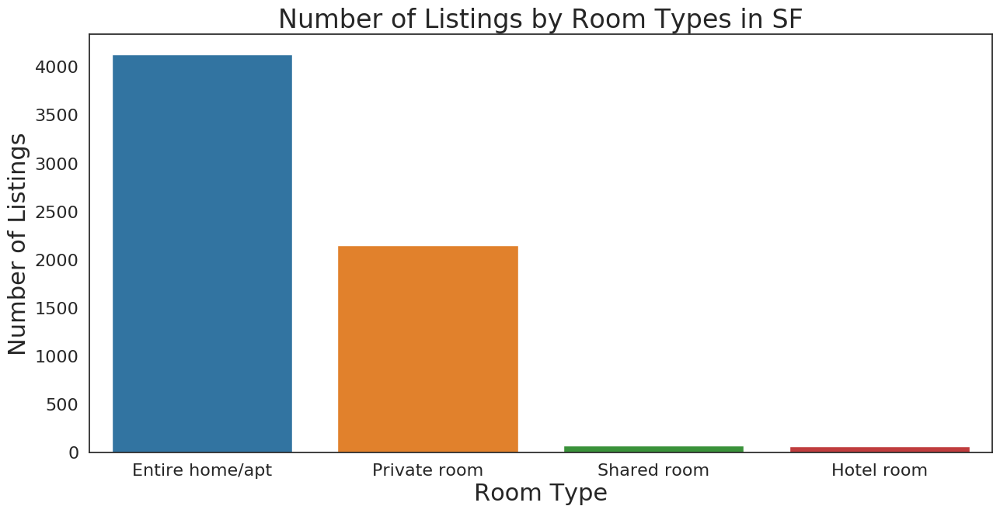

In [53]:
# plot for umber of Listings by Room Types in SF
sns.set(style="white")
plt.figure(figsize=(15,7))

ax = sns.countplot(x="room_type", data=df_sf, palette='tab10')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.title("Number of Listings by Room Types in SF", fontsize=24)
plt.xlabel('Room Type', fontsize=22)
plt.ylabel('Number of Listings', fontsize=22)
# plt.xticks(rotation=90)
plt.show()
show()

Text(0.5, 1.0, 'Median Price & Number of Reviews by Room Types in SF')

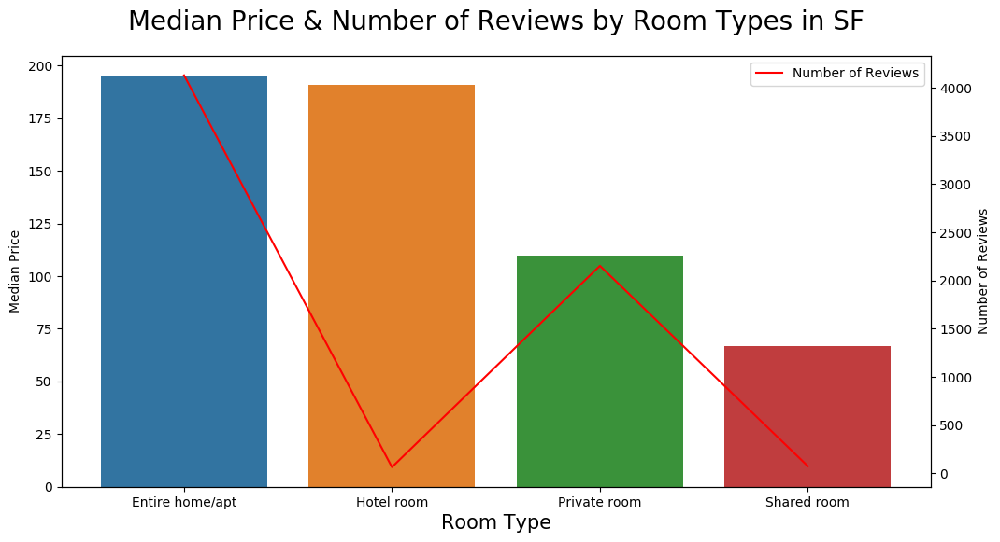

In [54]:
# plot for Median Price & Number of Reviews by Room Types in SF
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

matplotlib.rc_file_defaults()
ax1 = sns.set_style(style=None, rc=None )

fig, ax1 = plt.subplots(figsize=(12,6))

price_avg = df_sf.groupby('room_type').agg({'price': 'median'}).reset_index()
sns.barplot(x="room_type",y='price', data=price_avg, palette='tab10', ci=None,ax=ax1)
# plt.legend()
plt.xlabel("Room Type",fontsize=15)
plt.ylabel('Median Price')

ax2 = ax1.twinx()

sns.lineplot(x="room_type", y='number_of_reviews',data=df_review, palette='tab10',color='red',
             label = 'Number of Reviews',ax=ax2)
plt.ylabel('Number of Reviews')
# ax2.legend(loc=0)
plt.xlabel("Room Type",fontsize=15)
plt.title("Median Price & Number of Reviews by Room Types in SF", size=20,pad=20)

In San Francisco, Entire Home/Apartments and Private Rooms have more reviews, then Hotel Rooms or Shared Rooms when considering the room type column. This seems to mean that Hotel Rooms or Shared Rooms are less popular in the Airbnb market. 
Entire Home/Apartments and Private Rooms had the first highest and second highest median price. 
